In [3]:
import torch
import timm
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import torch.nn.functional as F
from torchvision.transforms.functional import to_pil_image

MODEL_PATH = '/d01/scholles/gigasistemica/saved_models/Full_Img/fastvit_t8_AUG_NEW_RB_CVAT_Train_FULL_IMG_C1_C3_Batch32_100Ep/fastvit_t8_AUG_NEW_RB_CVAT_Train_FULL_IMG_C1_C3_Batch32_100Ep.pth'
DATA_DIR_TEST = "/d01/scholles/gigasistemica/teste/full_img_vit"
BATCH_SIZE = 1

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

test_transform = transforms.Compose([
    transforms.Resize((449, 954)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),    
])

test_dataset = datasets.ImageFolder(DATA_DIR_TEST, transform=test_transform)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=True)

# Criar o modelo e registrar o hook
model = timm.create_model('fastvit_t8.apple_in1k', num_classes=2).to(device)
model.load_state_dict(torch.load(MODEL_PATH, map_location='cpu'))

# Asumindo que 'test_loader' e 'device' já estão definidos
model.eval()


FastVit(
  (stem): Sequential(
    (0): MobileOneBlock(
      (se): Identity()
      (conv_kxk): ModuleList(
        (0): ConvNormAct(
          (conv): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (bn): BatchNormAct2d(
            48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
            (drop): Identity()
            (act): Identity()
          )
        )
      )
      (conv_scale): ConvNormAct(
        (conv): Conv2d(3, 48, kernel_size=(1, 1), stride=(2, 2), bias=False)
        (bn): BatchNormAct2d(
          48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
          (drop): Identity()
          (act): Identity()
        )
      )
      (act): GELU(approximate=none)
    )
    (1): MobileOneBlock(
      (se): Identity()
      (conv_kxk): ModuleList(
        (0): ConvNormAct(
          (conv): Conv2d(48, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=48, bias=False)
          (bn): BatchNo

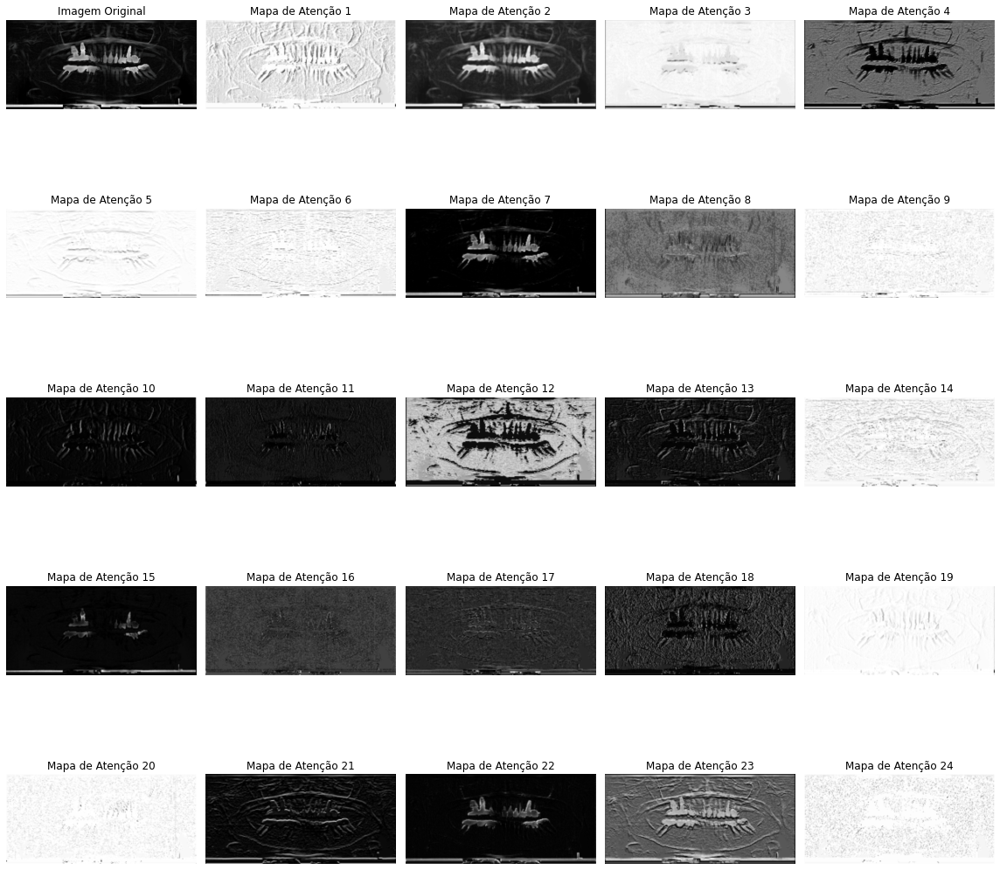

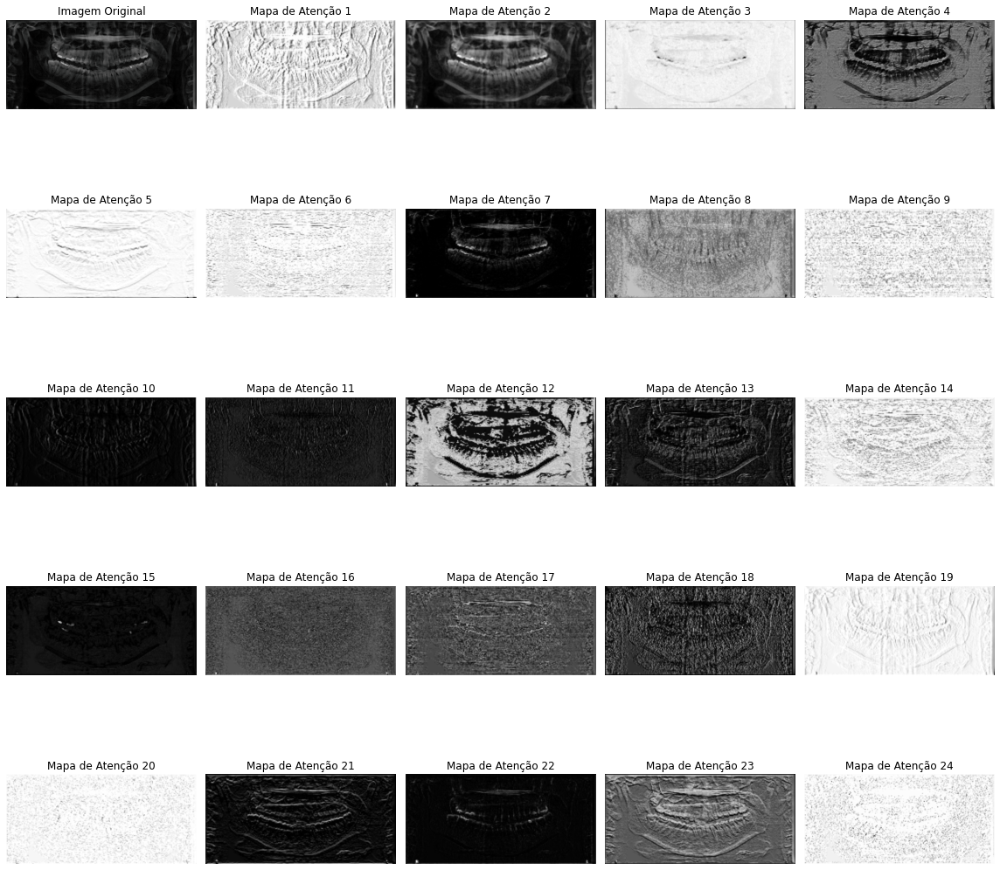

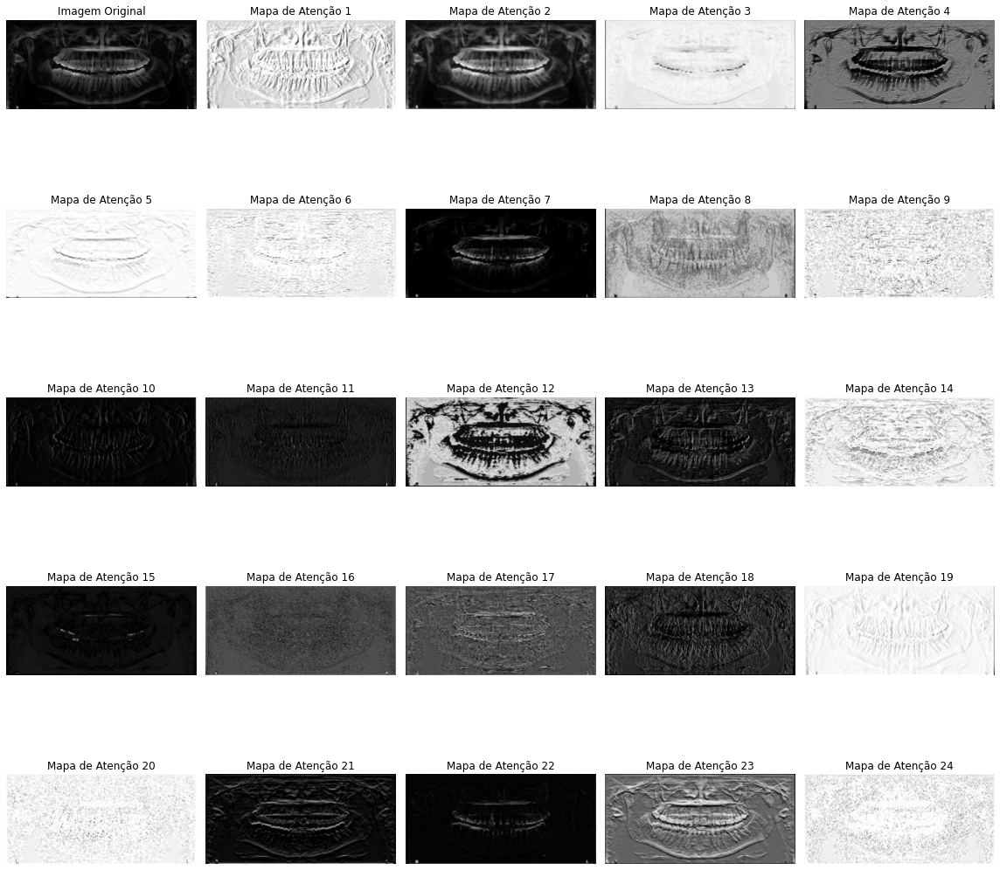

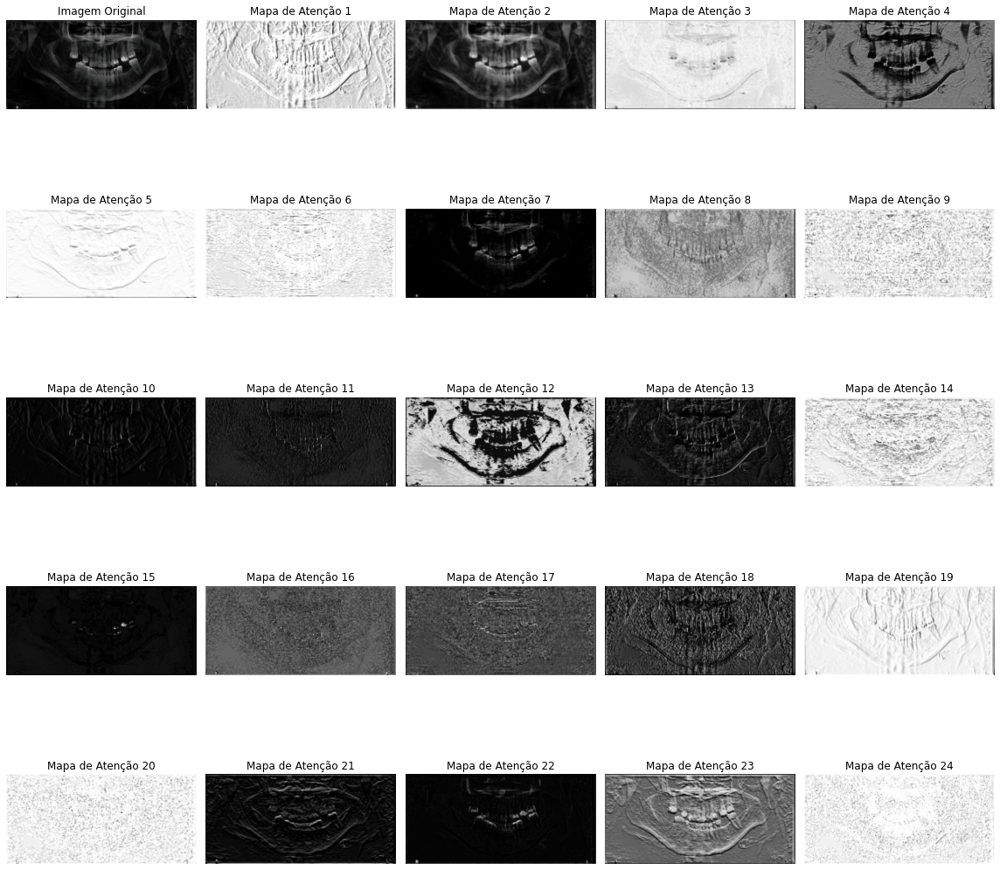

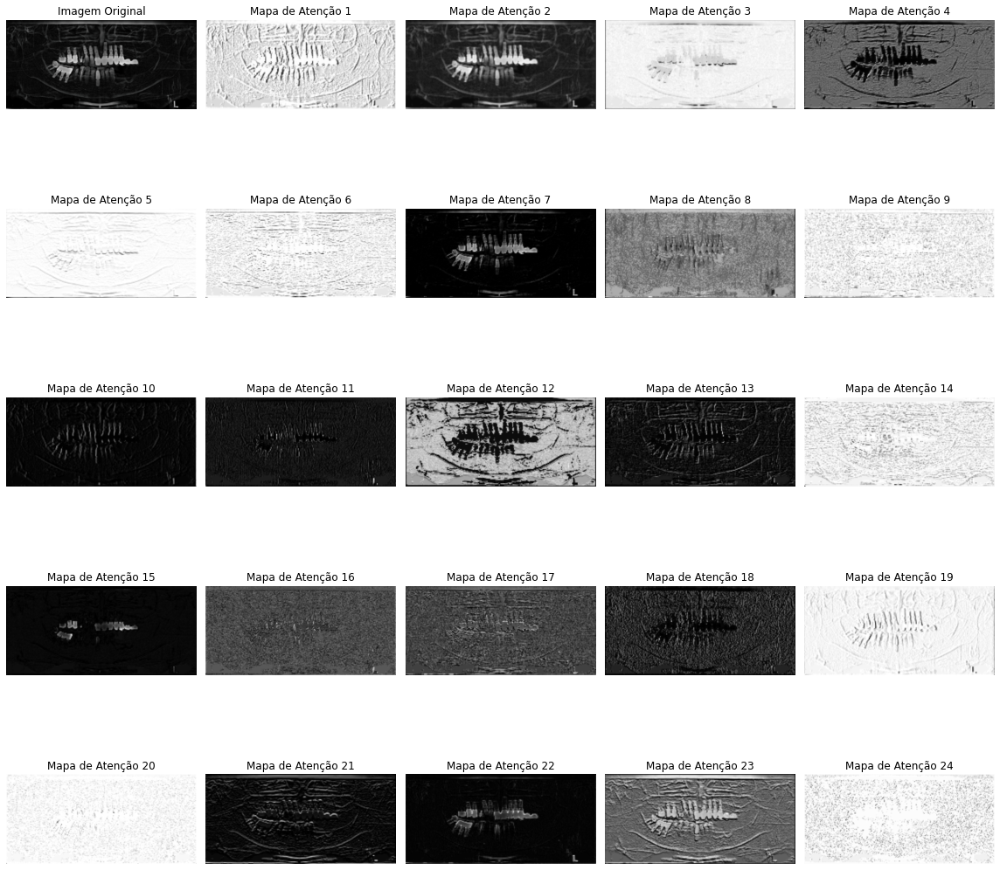

...

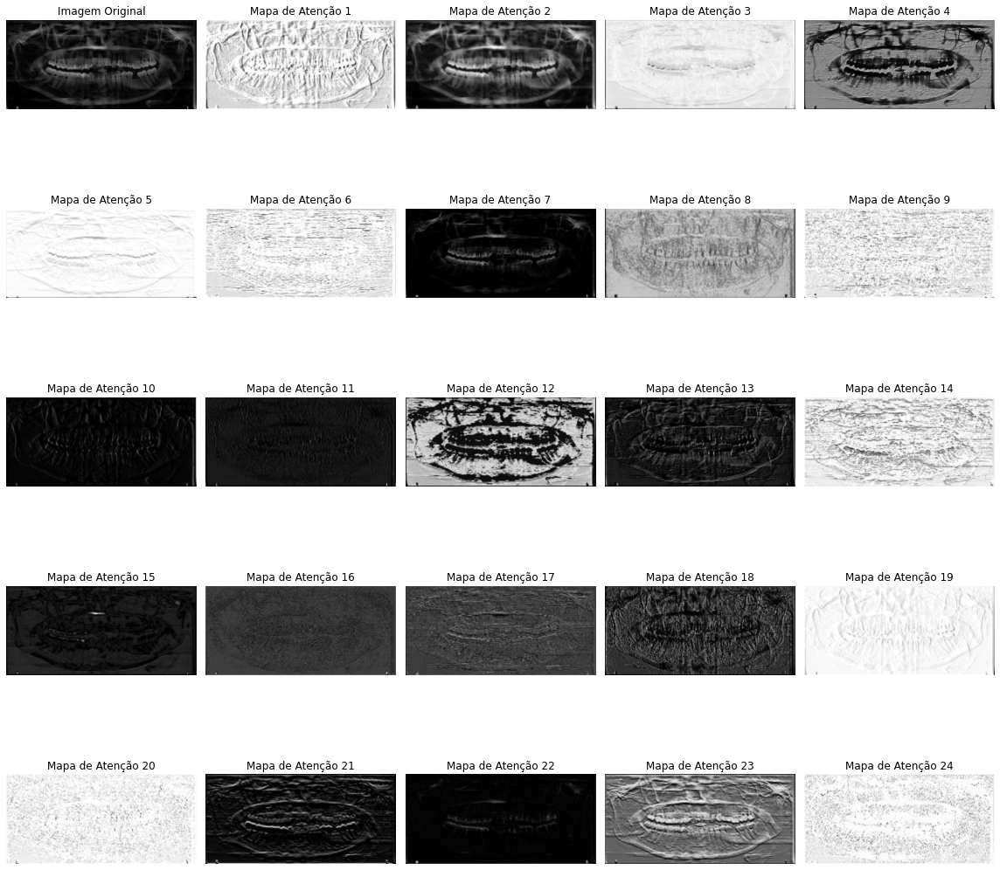

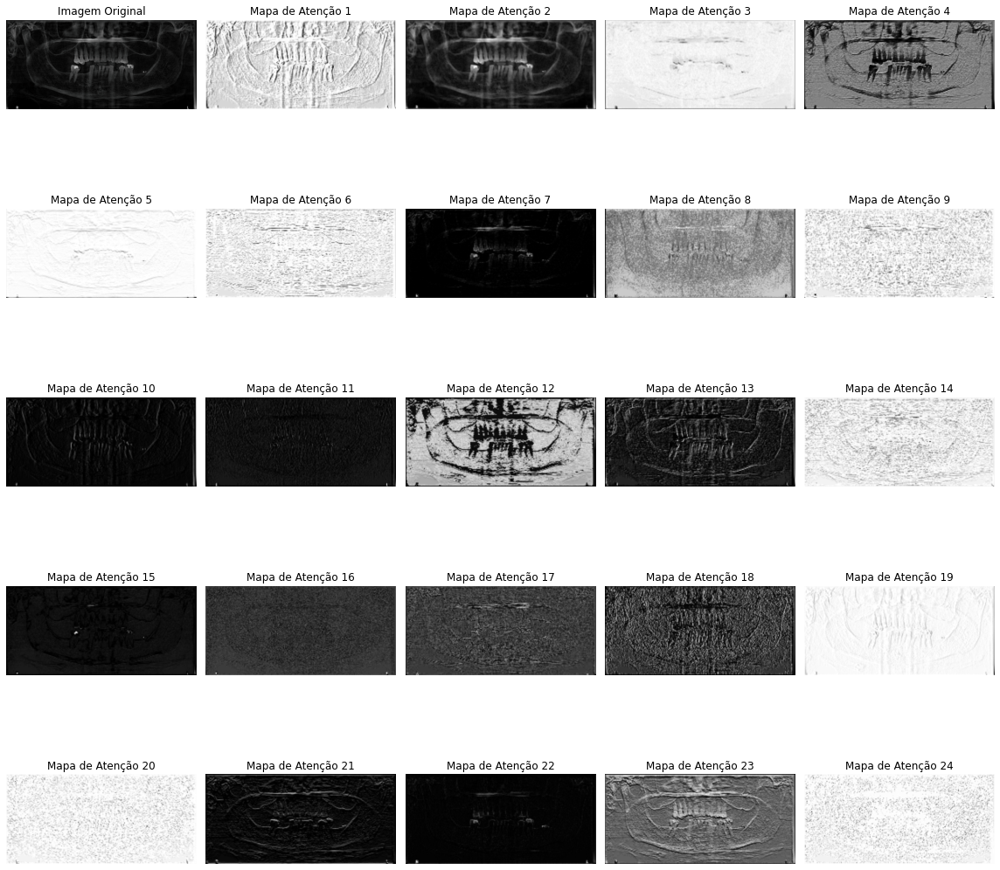

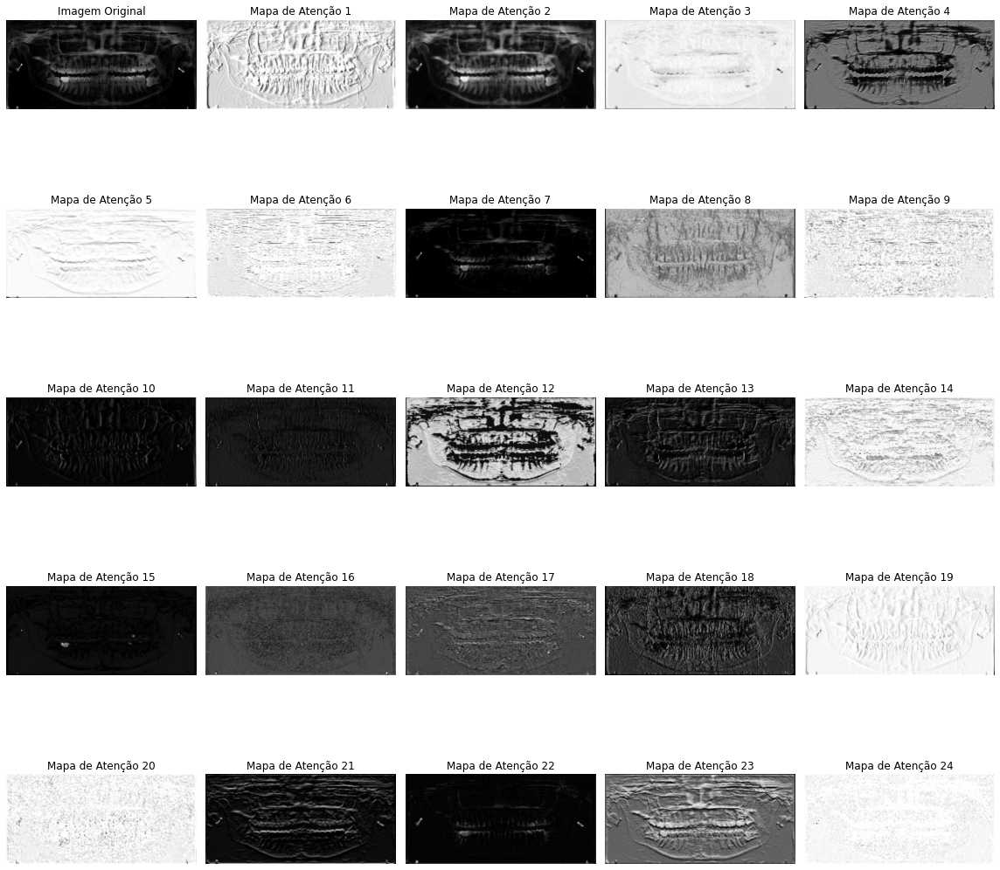

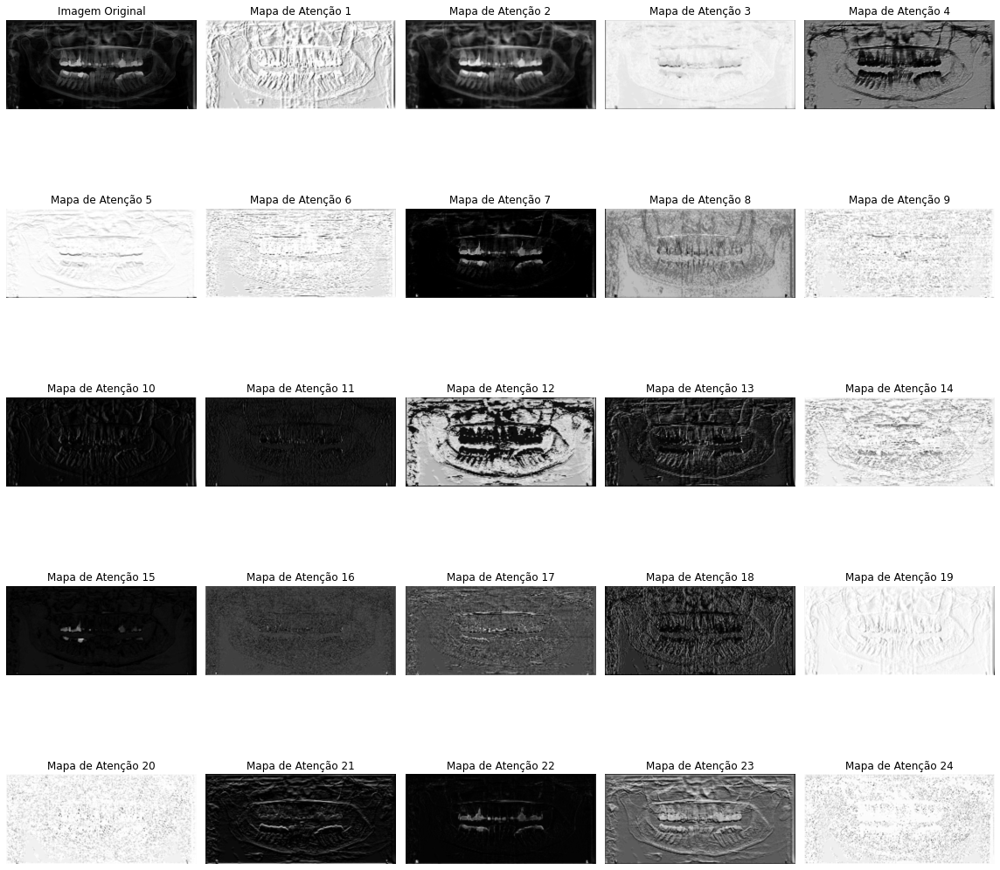

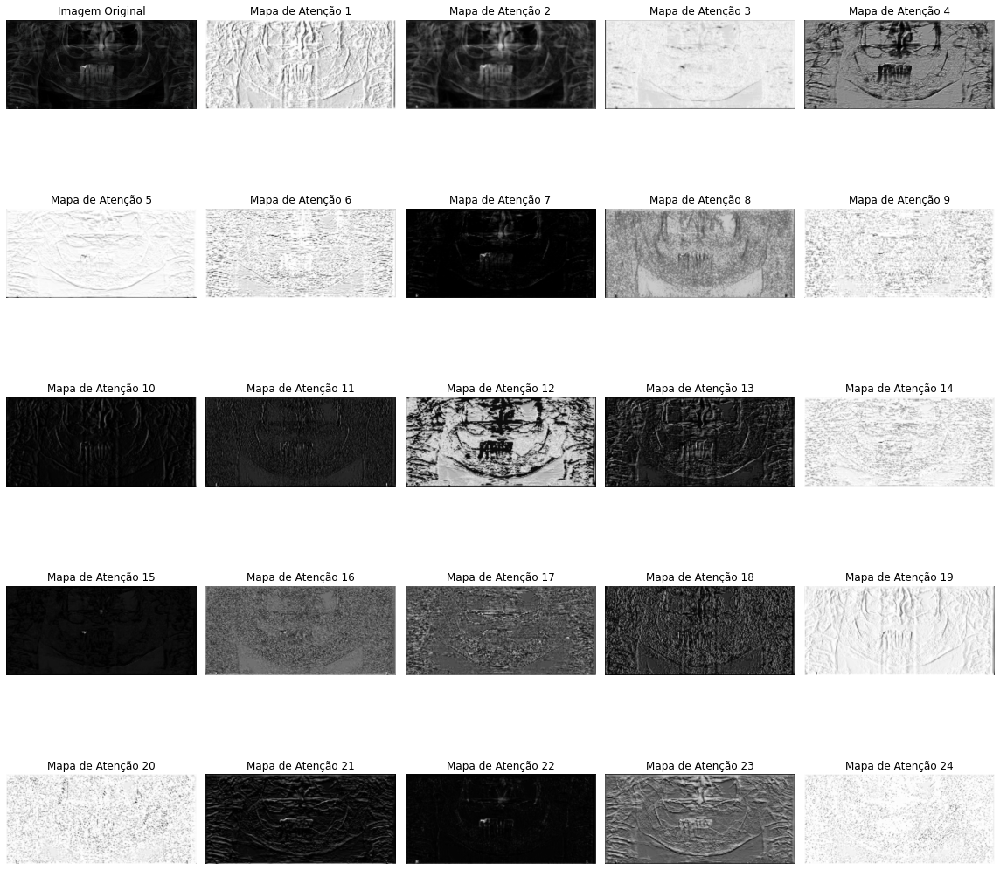

: 

In [10]:
n = 0
for image, _ in test_loader:
    mixer_outputs = []

    # Função de hook para extrair as saídas do mixer
    def hook_fn_mixer(module, input, output):
        mixer_outputs.append(output.detach())

    # Registrar o hook para todos os RepMixerBlocks
    for name, module in model.named_modules():
        if 'mixer' in name:
            module.register_forward_hook(hook_fn_mixer)
    
    # Passando uma única imagem pelo modelo para obter os mapas de atenção
    image = image.to(device)
    
    with torch.no_grad():
        _ = model(image)

    # Escolha o índice do bloco e da cabeça para visualização
    block_idx = 10  # Índice do bloco de mistura
    head_idx = 0  # Índice da cabeça de atenção, se houver várias

    # Obter o mapa de atenção do bloco desejado
    attention_map = mixer_outputs[block_idx][head_idx]

    # Normalizar os mapas de atenção
    attention_map = (attention_map - attention_map.min()) / (attention_map.max() - attention_map.min())

    # Redimensionar o mapa de atenção para o tamanho da imagem original
    attention_map_resized = F.interpolate(attention_map.unsqueeze(0), size=image.shape[2:], mode='bilinear', align_corners=False).squeeze(0)

    # Desfazendo a normalização da imagem original
    mean = torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1)
    image_normalized = image.to('cpu') * std + mean

    # Preparar a imagem original para plotagem
    original_img = to_pil_image(image_normalized[0].cpu())

    # Criar uma grade de subplots (4x4 para 16 mapas de features)
    fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(16, 16))

    # Plotar a imagem original no primeiro subplot
    axes[0, 0].imshow(original_img)
    axes[0, 0].set_title("Imagem Original")
    axes[0, 0].axis('off')

    # Plotar os mapas de atenção nos subplots restantes
    for i in range(1, 25):
        ax = axes[i // 5, i % 5]
        # Selecionando o i-ésimo mapa de atenção
        attention_map = attention_map_resized[i].cpu()
        ax.imshow(attention_map, cmap='gray')
        ax.set_title(f"Mapa de Atenção {i}")
        ax.axis('off')

    plt.tight_layout()